# Melody Accompainment Separation - Examples


## Description


This notebook presents the different approaches used to find a good way to remove melodic information from an audio signal.



Sumarizing, here are examplified the constructions below:

 1. Melodic mask with only fundamental frequencies
 1. Melodic mask with fundamental frequencies and their harmonics
 1. Melodic mask, like above, dilated of 2-size element
 1. Melodic mask, like above, using spectral novelty function
     1. dilated with original spectrum
     1. dilated with percussive spectrum
 1. Melodic mask with hit/miss algorithm
     1. dilated with original spectrum
     1. dilated with percussive spectrum


## Importing libraries, packages and defining parameters

In [1]:
# Print 
from __future__ import print_function

# We'll need numpy for some mathematical operations
import numpy as np

# matplotlib for displaying the output
import matplotlib.pyplot as plt
import matplotlib.style as ms
ms.use('seaborn-muted')
%matplotlib inline

# and IPython.display for audio output
import IPython.display

# Librosa for audio
import librosa
# And the display module for visualization
import librosa.display
# Functions of time
import time
# Open annotation file
import csv
# Melodia vamp plugin
import vamp
# Scientific python
import scipy
# Get signal processing functions
import scipy.signal as signal

# Make melodic mask
import src.core as utils

In [2]:
# Parameters to calculate the spectrogram
sr = 44100                  # Sample rate
win_length = 2048           # FFT Window size 
fb = sr/win_length          # FFT bins
fs = win_length/sr          # Frame size 
hop_length = win_length/4   # Hop size

## Loading the audio file

In [3]:
# You can choose an other example to calculate and listen the results
audio_path = 'audios/sample.wav'

# Load audio signal to y and sample rate to sr
audio, sr = librosa.load(audio_path, sr=sr)

# Calculate the complex spectrogram 
D = librosa.stft(audio, window=signal.cosine)

In [4]:
melody = utils.calculateMelodicLineMELODIA(audio)

## 1 - Melodic mask with only fundamental frequencies

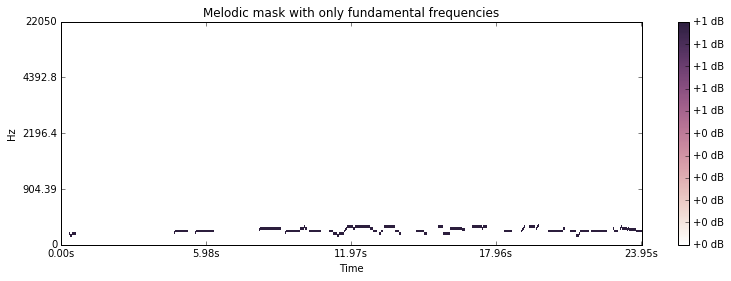

In [5]:
# Generate a melodic mask based on Melodia contours 
specMelodic = utils.generateMelodicMask(D, melody, kind=1)
plt.figure(figsize=(13,4))
librosa.display.specshow(specMelodic, y_axis='log', x_axis='time', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title('Melodic mask with only fundamental frequencies')
plt.show()

In [6]:
# Save the audio signal melodic
y_m = librosa.core.istft(specMelodic.astype(float)*D)
librosa.output.write_wav('example_1_melody.wav', y_m, sr, norm=False)

In [7]:
IPython.display.Audio(data=y_m, rate=sr)

In [8]:
del y_m

## 2 - Melodic mask with fundamental and harmonics

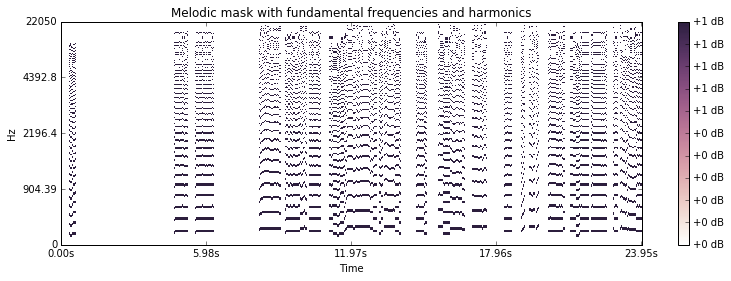

In [9]:
# Generate a melodic mask based on Melodia contours 
specMelodic = utils.generateMelodicMask(D, melody, kind=2, n_harm=50)
plt.figure(figsize=(13,4))
librosa.display.specshow(specMelodic, y_axis='log', x_axis='time', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title('Melodic mask with fundamental frequencies and harmonics')
plt.show()

In [10]:
# Save the audio signal melodic
y_m = librosa.core.istft(specMelodic.astype(float)*D)
librosa.output.write_wav('example_2_melody.wav', y_m, sr, norm=False)

In [11]:
IPython.display.Audio(data=y_m, rate=sr)

In [12]:
del y_m

## 3 - Melodic mask with fundamental and harmonics dilated

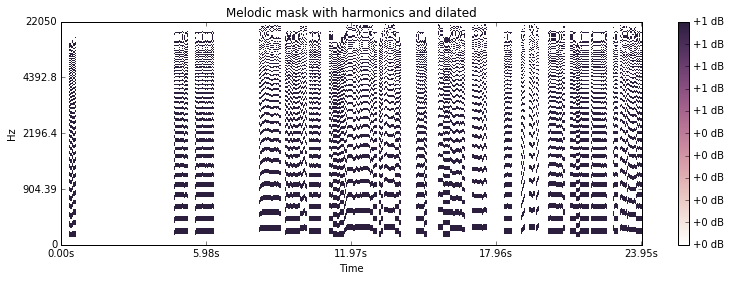

In [13]:
# Generate a melodic mask based on Melodia contours 
# You also can define the number of harmonics
specMelodic = utils.generateMelodicMask(D, melody, kind=3, n_harm=50)
plt.figure(figsize=(13,4))
librosa.display.specshow(specMelodic, y_axis='log', x_axis='time', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title('Melodic mask with harmonics and dilated')
plt.show()

In [14]:
# Save the audio signal melodic
y_m = librosa.core.istft(specMelodic.astype(float)*D)
librosa.output.write_wav('example_3_melody.wav', y_m, sr, norm=False)

In [15]:
IPython.display.Audio(data=y_m, rate=sr)

In [16]:
del y_m

## 4A - Melodic mask using Spectral Novelty Function
### Dilated all spectrum

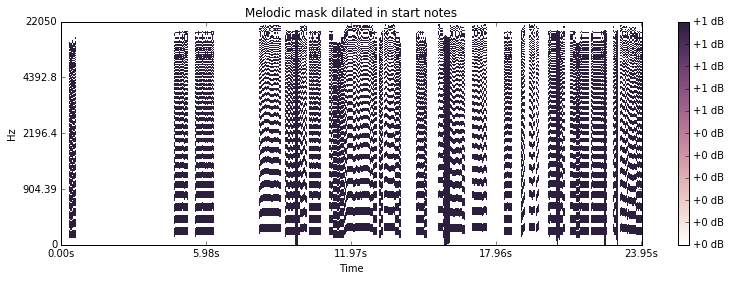

In [17]:
# Generate a melodic mask based on Melodia contours 
specMelodic = utils.generateMelodicMask(D, melody, kind=3, n_harm=50)
specMelodic = utils.spectralNoveltyFunction(D, specMelodic)
plt.figure(figsize=(13,4))
librosa.display.specshow(specMelodic, y_axis='log', x_axis='time', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title('Melodic mask dilated in start notes')
plt.show()

In [18]:
# Save the audio signal melodic
y_m = librosa.core.istft(specMelodic.astype(float)*D)
librosa.output.write_wav('example_4_melody.wav', y_m, sr, norm=False)

In [19]:
IPython.display.Audio(data=y_m, rate=sr)

In [20]:
del y_m

## 4B - Melodic mask using Spectral Novelty Function
### Dilated only the percussive spectrum

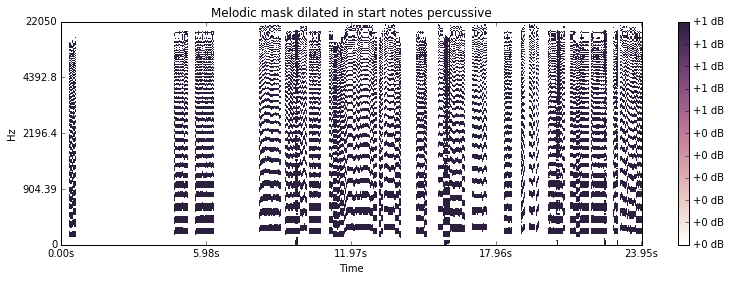

In [21]:
# Generate a melodic mask based on Melodia contours 
specMelodic = utils.generateMelodicMask(D, melody, kind=3, n_harm=50)
specDilated = utils.spectralNoveltyFunction(D, specMelodic)

# Getting masks from librosa 
mask_H, mask_P = librosa.decompose.hpss(D, mask=True)

specPercuss = np.maximum(np.multiply(specDilated, mask_P), specMelodic)
plt.figure(figsize=(13,4))
librosa.display.specshow(specPercuss, y_axis='log', x_axis='time', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title('Melodic mask dilated in start notes percussive')
plt.show()

In [22]:
# Save the audio signal melodic
y_m = librosa.core.istft(specMelodic.astype(float)*D)
librosa.output.write_wav('example_5_melody.wav', y_m, sr, norm=False)

In [23]:
IPython.display.Audio(data=y_m, rate=sr)

In [24]:
del y_m

## 5A - Melodic mask with Hit Miss Algorithm
### Dilated all spectrum

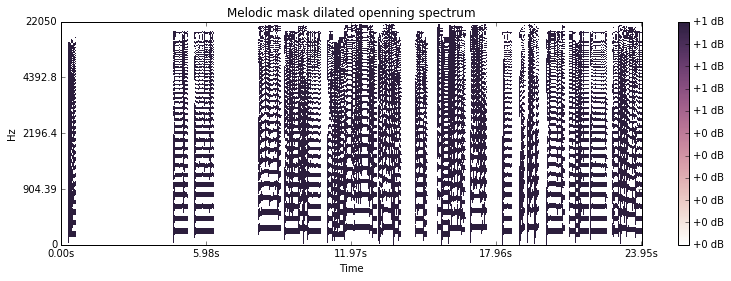

In [25]:
# Generate a melodic mask based on Melodia contours 
# You also can define the number of harmonics
specMelodic = utils.generateMelodicMask(D, melody, kind=3, n_harm=50)
specHit, specHitDilated, specMax = utils.hitMissDilateMask(specMelodic)
del specHit, specHitDilated
plt.figure(figsize=(13,4))
librosa.display.specshow(specMax, y_axis='log', x_axis='time', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title('Melodic mask dilated openning spectrum')
plt.show()

In [26]:
# Save the audio signal melodic
y_m = librosa.core.istft(specMelodic.astype(float)*D)
librosa.output.write_wav('example_6_melody.wav', y_m, sr, norm=False)

In [27]:
IPython.display.Audio(data=y_m, rate=sr)

In [28]:
del y_m

## 5B - Melodic mask with Hit Miss Algorithm
### Dilated only the percussive spectrum

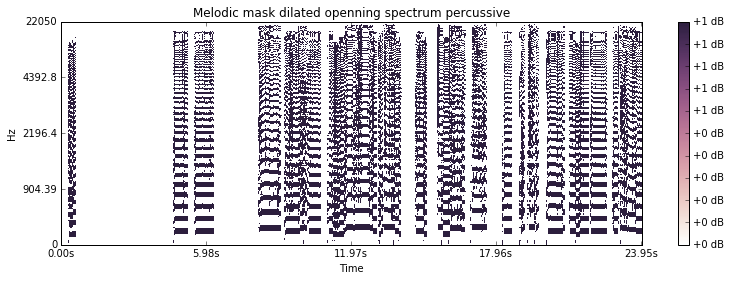

In [29]:
# Generate a melodic mask based on Melodia contours 
# You also can define the number of harmonics
specMelodic = utils.generateMelodicMask(D, melody, kind=3, n_harm=50)
specHit, specHitDilated, specMax = utils.hitMissDilateMask(specMelodic)
del specHit, specHitDilated

# Getting masks from librosa 
mask_H, mask_P = librosa.decompose.hpss(D, mask=True)

specPercuss = np.maximum(np.multiply(specMax, mask_P), specMelodic)

plt.figure(figsize=(13,4))
librosa.display.specshow(specPercuss, y_axis='log', x_axis='time', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title('Melodic mask dilated openning spectrum percussive')
plt.show()

In [30]:
# Save the audio signal melodic
y_m = librosa.core.istft(specMelodic.astype(float)*D)
librosa.output.write_wav('example_7_melody.wav', y_m, sr, norm=False)

In [31]:
IPython.display.Audio(data=y_m, rate=sr)

In [32]:
del y_m